# Predicting Song Success using Audio Features

### Table of Contents

>[Predicting Song Success using Audio Features](#scrollTo=TjX-rZ_dyVd3&uniqifier=1)

>>>[Table of Contents](#scrollTo=YPfJyeukG10x&uniqifier=1)

>>[Introduction](#scrollTo=deMGosYgVseB&uniqifier=1)

>>>[00a. Report Summary](#scrollTo=i6JPu0GdUFcN&uniqifier=1)

>>>[00b. Business Problem Definition](#scrollTo=UcBXbN2jygW8&uniqifier=1)

>>>>[Why is this important?](#scrollTo=UcBXbN2jygW8&uniqifier=1)

>>>[00c. Setting up the workspace](#scrollTo=rlpT3tANSdiX&uniqifier=1)

>>[Describing the Data](#scrollTo=5jKBs6noyya2&uniqifier=1)

>>>[01a. Definition of each variable](#scrollTo=N9dhbSJQ0Hjk&uniqifier=1)

>>>[01b. More about the data:](#scrollTo=7OvhuaQs06ht&uniqifier=1)

>>[Exploratory Data Analysis](#scrollTo=3B13VmiCySKS&uniqifier=1)

>>>[02a. Exploring variable relationships](#scrollTo=ORqlZ9DBDEfM&uniqifier=1)

>>>>[Danceability and Energy](#scrollTo=jH_ITfB64JT8&uniqifier=1)

>>>>[Exploring popular vs non-popular](#scrollTo=5gD1arXMMbJ6&uniqifier=1)

>>>>>[Analyzing variable relationships among popular songs](#scrollTo=bvG4X_6k-vN_&uniqifier=1)

>>>>[Finding which genres are the most popular](#scrollTo=IGjSe2_BzN6E&uniqifier=1)

>>>[02b. Are there any missing values?](#scrollTo=4fumQ4uoTb7Z&uniqifier=1)

>>>[02c. Preprocessing and cleaning the data](#scrollTo=xf9XVdYVThZq&uniqifier=1)

>>>>[Are there duplicate entries of unique tracks?](#scrollTo=i7jMVnipqZTb&uniqifier=1)

>>[Developing an accurate predictive model](#scrollTo=PhIFceTg48rX&uniqifier=1)

>>>[03a. Establishing the Variables](#scrollTo=zdxOM9AnMEwQ&uniqifier=1)

>>>[03b. The Biggest issue: track_genres](#scrollTo=V9tmmwJwUzOZ&uniqifier=1)

>>>>[K-Means Clustering](#scrollTo=W5n8u_DecI6N&uniqifier=1)

>>>>[Manually assigning genre groups](#scrollTo=7L6eV-b-cPrA&uniqifier=1)

>>>[03c. Using various models to predict popularity](#scrollTo=om8b8IUrGr_m&uniqifier=1)

>>>>[Gaussian Naive Bayes Model](#scrollTo=cwg7i7sKHOSi&uniqifier=1)

>>>>[Logistic Regression Model](#scrollTo=KcizkBKgGLWw&uniqifier=1)

>>>>[Decision Tree Model](#scrollTo=WI9ge2loIQSM&uniqifier=1)

>>>>[Random Forest Model](#scrollTo=BjtuGGwF_QjE&uniqifier=1)

>>[Understanding how features affect popularity](#scrollTo=S-dYkLRzKXWH&uniqifier=1)

>>>[04a. Using a XGBoost Model and SHAP to explain model predictions](#scrollTo=tep32Rq2u1JO&uniqifier=1)

>>>[04b. Using Parallel Coordinates Plot (PCP) to identify trends](#scrollTo=pEE9tP1L1qn3&uniqifier=1)

>>[Model Improvements](#scrollTo=OQ0gl6u1WtWS&uniqifier=1)

>>[Findings, Limitations and Conclusions](#scrollTo=lrPzgRPA2Xd6&uniqifier=1)

>>>[06a. The Problem with Music Genre](#scrollTo=wzz3E6TohMWw&uniqifier=1)

>>>[06b. External Limitations](#scrollTo=wzz3E6TohMWw&uniqifier=1)

>>>[06c. Data Limitations and Conclusions](#scrollTo=wzz3E6TohMWw&uniqifier=1)

>>>[06d. Possible Solutions](#scrollTo=wzz3E6TohMWw&uniqifier=1)

>[References](#scrollTo=th0EUUUVWYJR&uniqifier=1)



## 00. Introduction

### 00a. Report Summary

In this project we explore the factors that drive the likely popularity of a song. As we explored the data, we defined what we consider as a popular song. We then attempted to consolidate genres through K-means Clustering before we manually assigned genres into broader genres to consolidate it from 114 to 10. We then normalized the data and ran several models to get a robust model that could successfully tackle our business problem. We ended up using a Random Forest Model and ended up with a model that was able to successfully predict 54% of the popular songs.


### 00b. Business Problem Definition



Our goal in this project is to understand how different sound characteristics influence overall success of a song, and how we can predict an upcoming song’s success based on over 100,000 past data points and their unique audio features. In order to predict song success, we will explore different machine learning models and evaluate their overall performance. After we find a satisfactory model, we will explore which features are the most relevant to determine popularity.

#### Why is this important?

This model could be useful to tackle real-world dilemmas in the music industry and music-streaming services. Real-world applications of these predictions could include using the data to help underperforming and/or independent artists create new "hit" songs, as well as attempting to accurately predict high-level trends in the music industry and on streaming platforms.



### 00c. Setting up the workspace

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
pd.options.mode.chained_assignment = None   # Added this to remove warnings of changing our original dataframe, we know what we are doing

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
spotify_df_og = pd.read_csv('/content/drive/Shareddrives/Team 6 IS833/spotify_dataset.csv')

In [5]:
# Checking the dataset
spotify_df_og.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


## 01. Describing the Data

### 01a. Definition of each variable

* `track_id`: The Spotify ID for the track
* `artists`: The artists' names who performed the track. If there is more than one artist, they are separated by a `;`
* `album_name`: The album name in which the track appears
* `track_name`: Name of the track
* `popularity`: The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are. Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently. Artist and album popularity is derived mathematically from track popularity.
* `duration_ms`: The track length in milliseconds
* `explicit`: Whether or not the track has explicit lyrics (true = yes it does; false = no it does not OR unknown)
* `danceability`: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable
* `energy`: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale
* `key`: The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1
* `loudness`: The overall loudness of a track in decibels (dB)
* `mode`: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0
* `speechiness`: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks
* `acousticness`: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic
* `instrumentalness`: Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content
* `liveness`: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live
* `valence`: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry)
* `tempo`: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration
* `time_signature`: An estimated time signature. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). The time signature ranges from 3 to 7 indicating time signatures of 3/4, to 7/4.
* `track_genre`: The genre in which the track belongs

### 01b. More about the data:


The dataset presents a collection of about 114,000 songs that are on the Spotify platform. The dataset is a subset of all the songs that are on Spotify - but we are treating it as a random sample that can therefore represent the population of all songs on Spotify. The dataset has 1000 entries per genre category. The balanced representation of genres makes it easier to compare values of different variables across genres.

Many of the fields in the dataset are sound characteristics that have been assigned numeric values (listed above) in order to better quantify their features. In terms of song characteristics, genre is one of the only categorical fields in the dataset. We also have variables with binary classification, such as Mode (`1` or `0`) and Explicit (`True` or `False`).

For the goal stated in our problem definition, we can conclude that the independent variables for the prediction model will be the audio features of the tracks (i.e. liveness, energy, tempo, etc.), and the dependent variable will be the popularity score of the tracks.

The dataset's information comes from Spotify, and the dataset itself was sourced from [Kaggle](https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset).

## 02. Exploratory Data Analysis

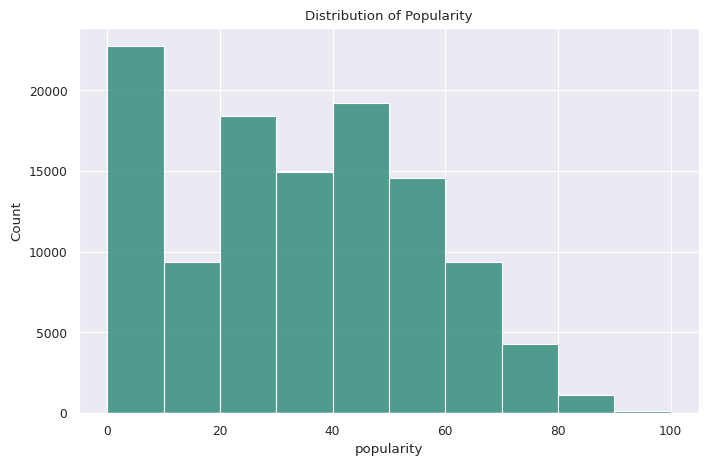

In [ ]:
# Plotting the distribution of songs in terms of popularity 
sns.set(rc={'figure.figsize':(8, 5)})
sns.set_context("paper")

sns.set_style("darkgrid")
sns.histplot(x = 'popularity', data = spotify_df_og, bins = 10, color="#1B826D").set(title='Distribution of Popularity');

In the above histogram, we see that the majority of the songs fall in the lower end of popularity. This means that we are working with quite low quantities of popular songs in comparison to unpopular songs. Overall, if we decide to process the `popularity` variable into one with binary values (i.e. popular vs non-popular), then this could render us with data that has imbalanced representation of popularity. In other words, unless our measure of popularity is set at the mean of the data, we could have much more non-popular data points than popular ones. We will later explain this potential imbalance. 

### 02a. Exploring variable relationships
Before delving into building a predictive model, a good way to begin to understand the data is to see how the independent variables interact with each other. 

We were quick to deduce that some audio features have a clear relationship to one another. However, to verify whether that is a reasonable assumption, we can map the frequency of the songs against these two audio features. Some possible examples of these correlated audio features include: speechiness and liveness (live concerts might include more spoken words), loudness and energy, and energy and danceability. We can first create a correlation heatmap to see if our assumptions are correct. 



<ipython-input-6-eba1c88391da>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = spotify_df_og.drop('Unnamed: 0', axis=1).corr()


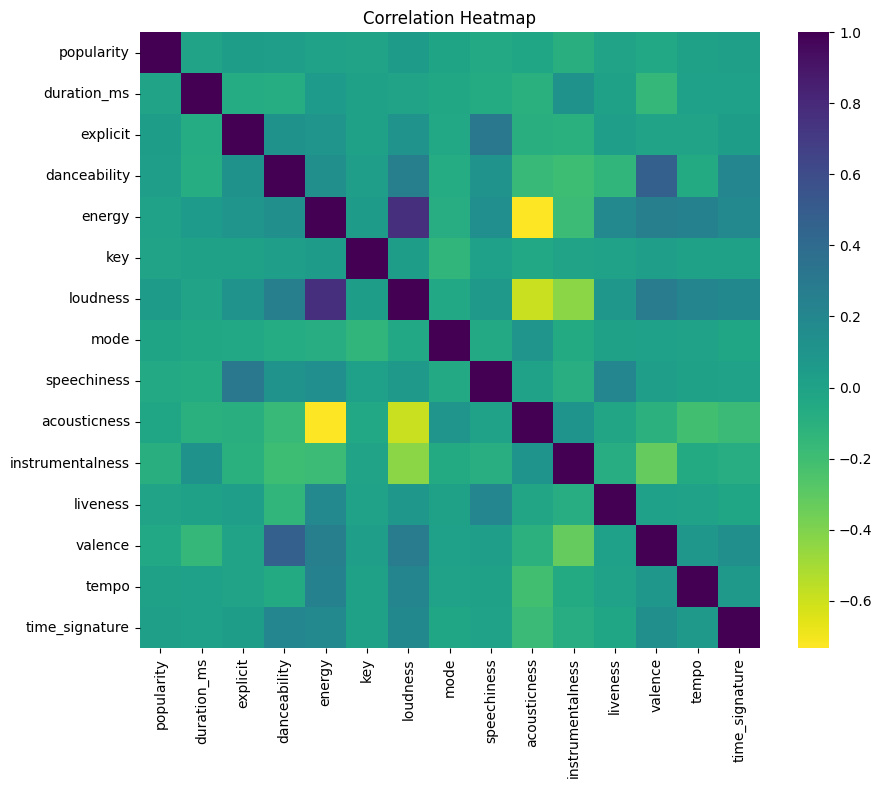

In [6]:
f, ax = plt.subplots(figsize=(10, 8))
corr = spotify_df_og.drop('Unnamed: 0', axis=1).corr()
sns.heatmap(corr, cmap="viridis_r").set(title="Correlation Heatmap");

We see above that the independent variables with the highest positive correlations are loudness and energy, and valence and danceability. The highest negative correlations are among acousticness and loudness/energy, and between instrumentalness and loudness. 

#### **Danceability and Energy**

Before looking at the correlation heatmap, it could be easy to say that Danceability and Energy are features that are positively correlated, since the more energetic a song is, the easier to dance to it is. However, the correlation heatmap above shows us that there is no significant correlation between them. Nevertheless, we wanted to explore how such seemingly uncorrelated variables impact the distribution of the data. 

As seen in the KDE plot below, we see that the densest area include songs that have high energy (0.7 to 0.95) and have a danceability rating between 0.5 and 0.7. Therefore, we cannot be certain that very energetic music has the highest danceability ratings. Nonetheless, we noticed that songs with the highest danceability ratings (>0.9) have an energy rating of at least 0.45.

We also added an extra variable in the plot, Explicit, showing how the densest areas are all close to each other. It seems that music with high energy and medium danceability are also more likely to be explicit. 

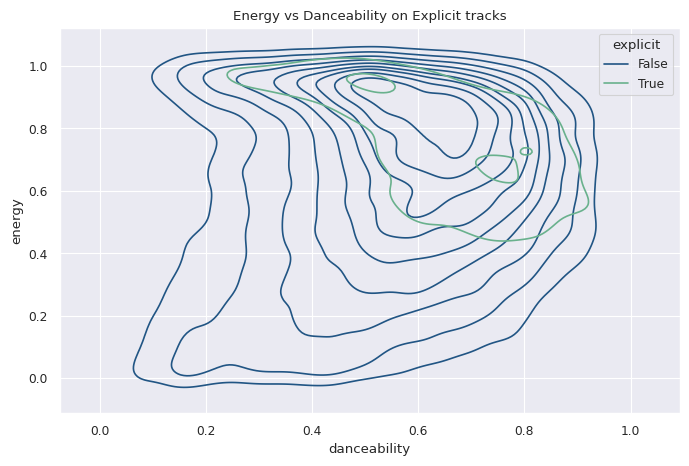

In [ ]:
sns.kdeplot(data=spotify_df_og, x='danceability', y='energy', hue="explicit", palette=["#215584", "#69b18d"]).set(title='Energy vs Danceability on Explicit tracks');

Now that we know how `danceability` and `energy` relate to one another, we can plot the distributions of two very "opposite" genres in terms of both danceability and energy. For these two genres, we decided to go for `edm` and `sleep`, since one of them is commonly associated with high-energy, dance music, and the other one low-energy, calming music. As we see below, the distribution shows us clear evidence that `edm` tracks fall into higher energy, more danceable types of music. Whereas `sleep` tracks are classified as lower energy, less danceable songs. 

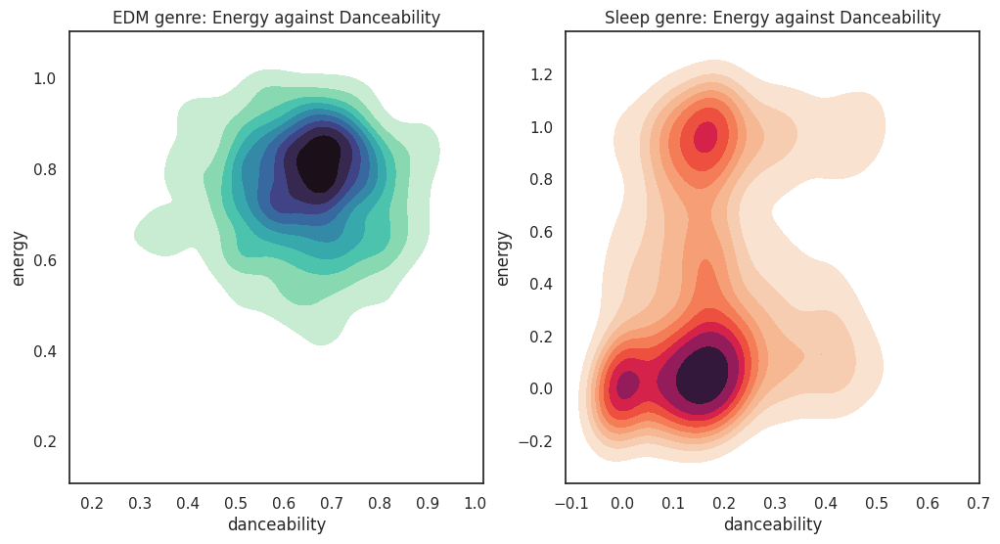

In [ ]:
sns.set(rc={'figure.figsize':(12,6)})
sns.set_style("white")

fig, ax = plt.subplots(1,2)
sns.kdeplot(data=spotify_df_og[spotify_df_og['track_genre'] == 'edm'], x='danceability', y='energy', ax=ax[0], fill=True, cmap="mako_r").set(title='EDM genre: Energy against Danceability')
sns.kdeplot(data=spotify_df_og[spotify_df_og['track_genre'] == 'sleep'], x='danceability', y='energy', ax=ax[1], fill=True, cmap="rocket_r").set(title='Sleep genre: Energy against Danceability');

#### **Exploring popular vs non-popular**

After looking at how the audio features relate to one another and how these play a role on overall distribution of the data, we will focus on looking at these audio features and how they interact with the variable that is on our main objective for the project: song popularity. 

In [ ]:
# Creating a subset of the database that only includes songs with popularity above 75
spotify_df_popular = spotify_df_og[spotify_df_og['popularity'] >= 75]
spotify_df_popular.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.443,...,-9.681,1,0.0526,0.4690,0.0000,0.0829,0.167,119.949,4,acoustic
7,7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.444,...,-9.331,1,0.0417,0.5590,0.0000,0.0973,0.712,150.960,4,acoustic
20,20,3S0OXQeoh0w6AY8WQVckRW,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,75,242946,False,0.703,0.444,...,-9.331,1,0.0417,0.5590,0.0000,0.0973,0.712,150.960,4,acoustic
60,60,08MFgEQeVLF37EyZ7jcwLc,Zack Tabudlo,Pano,Pano,75,254400,False,0.375,0.457,...,-7.018,1,0.0315,0.8680,0.0145,0.1910,0.415,174.839,3,acoustic
1100,1100,1q8NdCAQ9QUjpYiqzdd3mv,Calle 13,Calle 13 (Explicit Version),Atrévete-Te-Te,75,239306,True,0.829,0.878,...,-5.951,1,0.1010,0.0959,0.0000,0.7760,0.883,87.991,4,afrobeat


##### **Analyzing variable relationships among popular songs**

Continuing our analysis of independent variable relationships, we look at how variables that are commonly associated with each other interact within the subset of popular songs. 

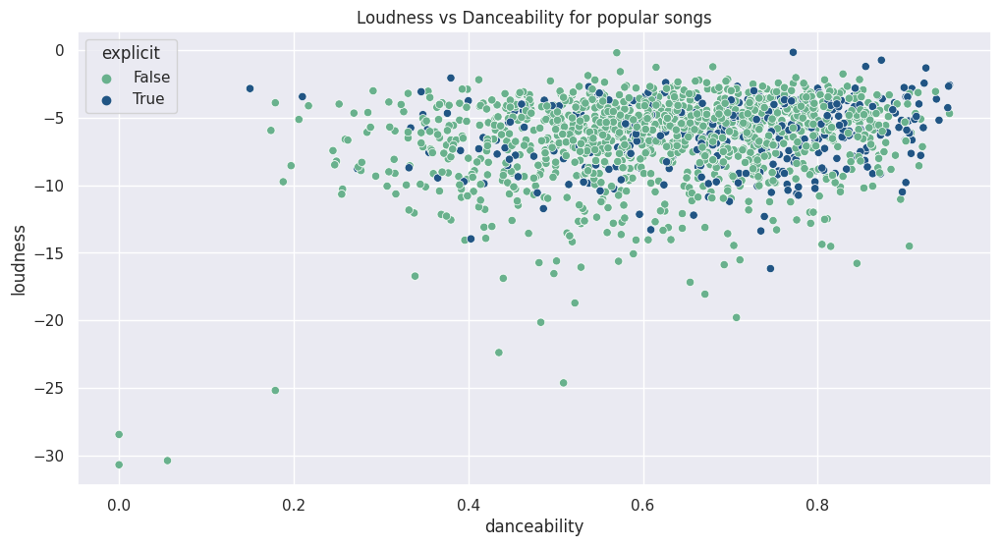

In [ ]:
sns.set_style("darkgrid")

sns.scatterplot(x = 'danceability', y = 'loudness', data = spotify_df_popular, hue = 'explicit', palette=["#69b18d", "#215584"]).set(title="Loudness vs Danceability for popular songs");

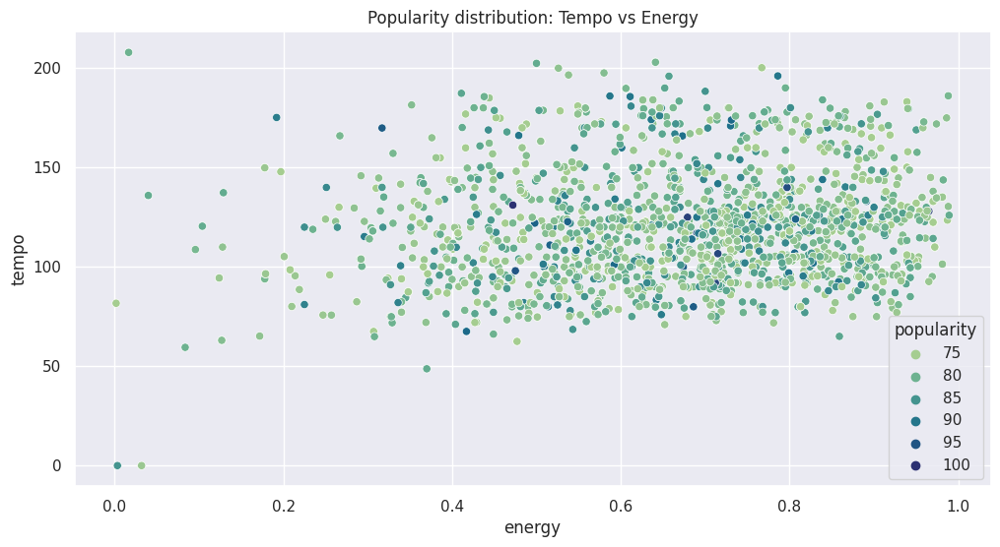

In [ ]:
sns.scatterplot(x = 'energy', y='tempo', data = spotify_df_popular, hue="popularity", palette="crest").set(title="Popularity distribution: Tempo vs Energy");

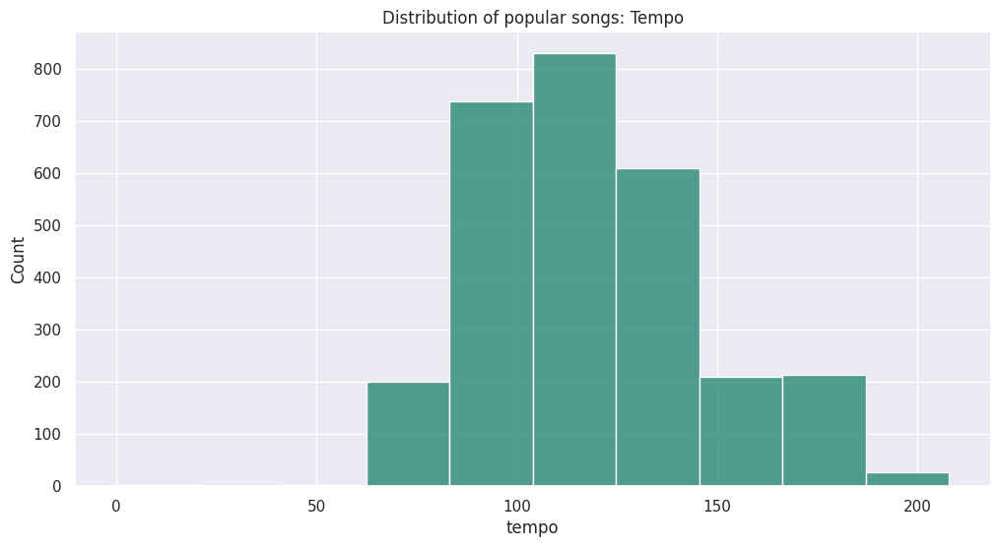

In [ ]:
sns.histplot(x='tempo', data= spotify_df_popular, bins=10, color="#1B826D").set(title="Distribution of popular songs: Tempo");

#### Finding which genres are the most popular

In [ ]:
# Creating a descriptive table that groups tracks based on genre, and sorts by highest popularity mean
view_genre = spotify_df_popular.groupby('track_genre')['popularity'].describe().sort_values('mean',ascending=False) 

In [ ]:
# Subsetting the previous table into only those that have more than 100 entries
view_genre[view_genre['count'] > 100].iloc[:,:2]

,count,mean
track_genre,,
pop,187.0,82.866310
latino,135.0,81.577778
reggaeton,118.0,81.466102
rock,170.0,80.641176
dance,194.0,80.639175
indie,129.0,79.488372
edm,103.0,79.000000
house,126.0,78.706349
electro,133.0,78.481203


We see that the most popular genres (more than 100 popular tracks) are the 9 genres listed above. There are many genres that overlap with each other, which makes sense since these will share similar song entries. We have `latino` and `reggaeton` which are quite related, the we see `dance`, `edm`, `house` and `electro`, which are also all part of the same genre of electronic music. We obviously see `pop` and `rock` among the list of most popular genres as well. 

In [ ]:
# Setting a container for the most popular genres 
genre_list = ['pop', 'latino', 'reggaeton', 'rock', 'dance','indie', 'edm', 'house', 'electro']

In [ ]:
# Filtering the popular set by the top 9 genres (more than 100 tracks in each genre) - Used ChatGPT to perfect the code
genre_df = spotify_df_popular[spotify_df_popular['track_genre'].isin(genre_list)]
genre_df

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
20000,20000,5IgjP7X4th6nMNDh4akUHb,Chris Brown,Indigo (Extended),Under The Influence,96,184613,True,0.733,0.690,...,-5.529,0,0.0427,0.06350,0.000001,0.1050,0.310,116.992,4,dance
20001,20001,3nqQXoyQOWXiESFLlDF1hG,Sam Smith;Kim Petras,Unholy (feat. Kim Petras),Unholy (feat. Kim Petras),100,156943,False,0.714,0.472,...,-7.375,1,0.0864,0.01300,0.000005,0.2660,0.238,131.121,4,dance
20003,20003,48QmG1dfvMuYLxMPt7KSRA,Sean Paul;Dua Lipa,Mad Love The Prequel,No Lie,83,221176,False,0.742,0.882,...,-2.862,1,0.1170,0.04660,0.000000,0.2060,0.463,102.040,4,dance
20004,20004,7BKLCZ1jbUBVqRi2FVlTVw,The Chainsmokers;Halsey,Closer,Closer,84,244960,False,0.748,0.524,...,-5.599,1,0.0338,0.41400,0.000000,0.1110,0.661,95.010,4,dance
20005,20005,0lYBSQXN6rCTvUZvg9S0lU,DJ Snake;Justin Bieber,Encore,Let Me Love You,84,205946,False,0.649,0.716,...,-5.371,1,0.0349,0.08630,0.000026,0.1350,0.163,99.988,4,dance
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91951,91951,5fVZC9GiM4e8vu99W0Xf6J,The Fray,How To Save A Life,How to Save a Life,80,262533,False,0.640,0.743,...,-4.080,1,0.0379,0.26900,0.000000,0.1010,0.361,122.035,4,rock
91959,91959,2RsAajgo0g7bMCHxwH3Sk0,Nirvana,Nevermind (Remastered),Come As You Are,79,218920,False,0.500,0.824,...,-5.846,0,0.0388,0.00016,0.001610,0.0916,0.539,120.125,4,rock
91960,91960,5ruzrDWcT0vuJIOMW7gMnW,The Strokes,The New Abnormal,The Adults Are Talking,79,309053,False,0.593,0.749,...,-5.670,1,0.0475,0.01130,0.106000,0.3140,0.649,164.959,4,rock
91963,91963,3BQHpFgAp4l80e1XslIjNI,The Beatles,Help! (Remastered),Yesterday - Remastered 2009,76,125666,False,0.332,0.179,...,-11.830,1,0.0326,0.87900,0.000000,0.0886,0.315,96.529,4,rock


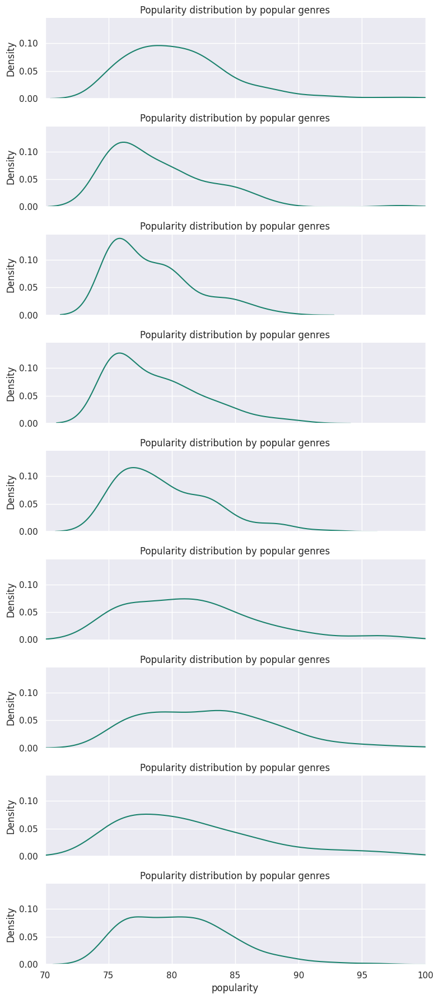

In [ ]:
# Visualizing the distribution of popularity among the popular genres
from matplotlib.pyplot import hist
sns.FacetGrid(genre_df, row='track_genre', aspect=4, height=2, xlim=(70,100)).map(sns.kdeplot, "popularity", color="#1B826D").set(title="Popularity distribution by popular genres");

### 02b. Are there any missing values?

In [ ]:
# Looking at the data types and null counts for each column
spotify_df_og.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [ ]:
# Finding the entry that has the null values for artists, album_name, and track_name
spotify_df_og[spotify_df_og.album_name.isnull() == True]

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


In [ ]:
# Does the same track_id have another entry with non-null values? 
spotify_df_og[spotify_df_og.track_id == '1kR4gIb7nGxHPI3D2ifs59']

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


As seen above, we have found a track that has no artist name, album name or track name. However, we have its unique track id. Considering that the `track_id` is the only thing that separates each unique observation, we can ignore the other information and drop those columns. 

In [ ]:
# Dropping unnecessary columns
spotify_df = spotify_df_og.drop(['artists', 'album_name', 'track_name', 'Unnamed: 0'], axis=1)

### 02c. Preprocessing and cleaning the data

In [ ]:
# Looking at each column's value ranges and general descriptive statistics of the data
round(spotify_df_og.describe().iloc[1:,:], 4)

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
mean,56999.5000,33.2385,2.280292e+05,0.5668,0.6414,5.3091,-8.2590,0.6376,0.0847,0.3149,0.1560,0.2136,0.4741,122.1478,3.9040
std,32909.1097,22.3051,1.072977e+05,0.1735,0.2515,3.5600,5.0293,0.4807,0.1057,0.3325,0.3096,0.1904,0.2593,29.9782,0.4326
min,0.0000,0.0000,0.000000e+00,0.0000,0.0000,0.0000,-49.5310,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,28499.7500,17.0000,1.740660e+05,0.4560,0.4720,2.0000,-10.0130,0.0000,0.0359,0.0169,0.0000,0.0980,0.2600,99.2188,4.0000
50%,56999.5000,35.0000,2.129060e+05,0.5800,0.6850,5.0000,-7.0040,1.0000,0.0489,0.1690,0.0000,0.1320,0.4640,122.0170,4.0000
75%,85499.2500,50.0000,2.615060e+05,0.6950,0.8540,8.0000,-5.0030,1.0000,0.0845,0.5980,0.0490,0.2730,0.6830,140.0710,4.0000
max,113999.0000,100.0000,5.237295e+06,0.9850,1.0000,11.0000,4.5320,1.0000,0.9650,0.9960,1.0000,1.0000,0.9950,243.3720,5.0000


As we see in the table, the scale of each variable is very different. We have one variable with values in the thousands (duration in milliseconds), while most other variables have a range between 0 to 1. We see other variables that have maximum values above 1 such as Key, Tempo and Loudness. Loudness is the only variable with negative values, which makes its minimum values fall down to -50. The rest of the variables have a minimum value of zero. Below, we have scaled each of the continuous variables to a range between 0 and 1 for easier comparison.

In [ ]:
# Changing the boolean values of explicit into 0 and 1
spotify_df.explicit = spotify_df.explicit.replace({True: 1, False: 0})

In [ ]:
# Normalizing the data (dividing the values by their maximum absolute value)
spotify_df_scaled = spotify_df.copy()

for column in spotify_df_scaled.iloc[:, 1:16].columns:
    spotify_df_scaled[column] = (spotify_df_scaled[column]-spotify_df_scaled[column].min()) / (spotify_df_scaled[column].max()-spotify_df_scaled[column].min())

In [ ]:
# Looking at the new normalized data
spotify_df_scaled.describe().round(2)

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00,114000.00
mean,0.33,0.04,0.09,0.58,0.64,0.48,0.76,0.64,0.09,0.32,0.16,0.21,0.48,0.50,0.78
std,0.22,0.02,0.28,0.18,0.25,0.32,0.09,0.48,0.11,0.33,0.31,0.19,0.26,0.12,0.09
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.17,0.03,0.00,0.46,0.47,0.18,0.73,0.00,0.04,0.02,0.00,0.10,0.26,0.41,0.80
50%,0.35,0.04,0.00,0.59,0.68,0.45,0.79,1.00,0.05,0.17,0.00,0.13,0.47,0.50,0.80
75%,0.50,0.05,0.00,0.71,0.85,0.73,0.82,1.00,0.09,0.60,0.05,0.27,0.69,0.58,0.80
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [ ]:
# Checking the value count and data types of the new dataset
spotify_df_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   popularity        114000 non-null  float64
 2   duration_ms       114000 non-null  float64
 3   explicit          114000 non-null  float64
 4   danceability      114000 non-null  float64
 5   energy            114000 non-null  float64
 6   key               114000 non-null  float64
 7   loudness          114000 non-null  float64
 8   mode              114000 non-null  float64
 9   speechiness       114000 non-null  float64
 10  acousticness      114000 non-null  float64
 11  instrumentalness  114000 non-null  float64
 12  liveness          114000 non-null  float64
 13  valence           114000 non-null  float64
 14  tempo             114000 non-null  float64
 15  time_signature    114000 non-null  float64
 16  track_genre       11

After the main data cleaning efforts, we see that all of the columns now have float data types, and that the only two columns with object data types are the `track_id` and the `track_genre`. We should work on dummifying the `track_genre` column into several separate variables

In [ ]:
# Overview of the range of unique values for each variable
spotify_df_og.nunique()

Unnamed: 0          114000
track_id             89741
artists              31437
album_name           46589
track_name           73608
popularity             101
duration_ms          50697
explicit                 2
danceability          1174
energy                2083
key                     12
loudness             19480
mode                     2
speechiness           1489
acousticness          5061
instrumentalness      5346
liveness              1722
valence               1790
tempo                45653
time_signature           5
track_genre            114
dtype: int64

Looking at the results above, we can see that the `track_genre` variable has 114 unique values. Therefore, it might be hard to manage if we dummify every single track genre. We seeked a different way to make use of the information that `track_genre` could provide us, rather than simply dropping this variable altogether. 

Something else we see in the cell above is that there are less number of unique track ids than the actual number of entries in this dataset. Therefore, there are multiple entries for the same unique data point (i.e. track). We will be exploring this issue later on. 

In [ ]:
# Listing all the genres within the dataset 
spotify_df.track_genre.unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

In [ ]:
# How many entries are there per genre?
spotify_df.track_genre.value_counts()

acoustic             1000
punk-rock            1000
progressive-house    1000
power-pop            1000
pop                  1000
                     ... 
folk                 1000
emo                  1000
electronic           1000
electro              1000
world-music          1000
Name: track_genre, Length: 114, dtype: int64

#### Are there duplicate entries of unique tracks?

In [ ]:
spotify_df.nunique()

track_id            89741
popularity            101
duration_ms         50697
explicit                2
danceability         1174
energy               2083
key                    12
loudness            19480
mode                    2
speechiness          1489
acousticness         5061
instrumentalness     5346
liveness             1722
valence              1790
tempo               45653
time_signature          5
track_genre           114
dtype: int64


One might assume that each `track_id` is unique, but upon exploration we found that there are only `89741` unique values. Looking further into these values, we found that this occurred because in some cases, one song was placed into multiple genres. Unless we are removing 'track_genre', it is difficult for us to remove these duplicate values because songs often do belong in multiple genres. If we drop genre later on in our analysis, then we could more easily remove duplicate songs from our dataset.

In [ ]:
spotify_df['track_id'].value_counts()

6S3JlDAGk3uu3NtZbPnuhS    9
2Ey6v4Sekh3Z0RUSISRosD    8
2kkvB3RNRzwjFdGhaUA0tz    8
5ZsAhuQ24mWHiduaxJqnhW    7
08kTa3SL9sV6Iy8KLKtGql    7
                         ..
0kJ7eKX6aWl8X1W5Xrosn6    1
4bYH5445Bn2w9UiGM0NxQw    1
1T5C6ENvpM3IiYeezsK9uI    1
34SatKRJgtXfL0bcgk7HMA    1
2hETkH7cOfqmz3LqZDHZf5    1
Name: track_id, Length: 89741, dtype: int64

In [ ]:
spotify_df[spotify_df['track_id'] == '6S3JlDAGk3uu3NtZbPnuhS']

,track_id,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
8315,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,blues
19759,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,country
34728,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,folk
62226,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,j-pop
63087,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,j-rock
82064,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,power-pop
84129,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,psych-rock
99727,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,singer-songwriter
102732,6S3JlDAGk3uu3NtZbPnuhS,67,217346,0,0.623,0.876,11,-7.788,1,0.066,0.0189,0.0134,0.0728,0.515,124.431,4,songwriter


## 03. Developing an accurate predictive model

### 03a. Establishing the Variables

Before building a predictive model, we will set popularity as a binary classification variable (popular and non-popular) to help probabilistic models such as Logistic Regression and Gaussian Naive Bayes to predict the chance that a song has of being popular. We decided to place the top 10% of the songs under the 'popular' category, even if that does not mean we will have the most effective model. Popularity of 64 and above represents the top 10%.

In [ ]:
spotify = spotify_df_scaled.copy()

# Creating a column that classifies popular vs unpopular songs, and then dummifying this variable
spotify['popularity_bin'] = pd.cut(spotify['popularity'], bins=[-0.01,0.63,1.00],labels=['under_64_pop','over_64_pop']) # Based on the 90th percentile of the data - 64 or the normalized 0.64
pop_dummy = pd.get_dummies(spotify['popularity_bin'])
spotify = pd.concat([spotify, pop_dummy], axis=1)

In [ ]:
# Making sure that the two groups look as expected
spotify[spotify.under_64_pop == 0].popularity, spotify[spotify.under_64_pop == 1].popularity

(0         0.73
 3         0.71
 4         0.82
 6         0.74
 7         0.80
           ... 
 113019    0.67
 113023    0.64
 113024    0.66
 113027    0.65
 113091    0.64
 Name: popularity, Length: 10407, dtype: float64,
 1         0.55
 2         0.57
 5         0.58
 9         0.56
 12        0.52
           ... 
 113995    0.21
 113996    0.22
 113997    0.22
 113998    0.41
 113999    0.22
 Name: popularity, Length: 103593, dtype: float64)

In [ ]:
# Do we have tracks with popularity of 0? (songs that have never been played at all)
spotify_df_og[spotify_df_og['popularity'] == 0.00].shape

(16020, 21)

In [ ]:
#Drop all songs with 0 popularity
spotify = spotify[spotify['popularity'] != 0.00]

Additionally, we decided to drop all songs with a 0 popularity. Songs with 0 popularity skew the data as 16,020 songs have never been played at all and we want to focus on songs that are played to compare their audio features to one another.

In [ ]:
pd.options.mode.chained_assignment = None

spotify.drop(['under_64_pop', 'popularity_bin'], inplace=True, axis=1)   # Dropping unnecessary columns
spotify.rename(columns={'over_64_pop' : 'popular'}, inplace=True)   # Renaming the column

In [ ]:
# Setting the initial X and y variables
X_1 = spotify.drop(['popularity', 'popular', 'track_id', 'track_genre'], axis=1)
y_1 = spotify['popular']

### 03b. The Biggest issue: `track_genres`

At this point, we were satisfied with the dataset, but decided to take one more step before running a supervised learning model. One of the biggest issues we have is establishing how to make use of the `track_genres` variable for future predictive models. We decided to start by running a K-Means Clustering process in the attempt to have the model create genre-groups by itself without knowing the genre each song belongs to. If possible, this would give us a smaller number of genre categories to work with whilst making valid use of the `track_genres` variable. I that does not work well, we have also thought about mannually creating larger groups of genres. 

#### K-Means Clustering

In [ ]:
from sklearn.decomposition import PCA 

spotify_K = spotify.copy()

pca = PCA(n_components=2)
pca.fit(X_1)
X_2D = pca.transform(X_1)

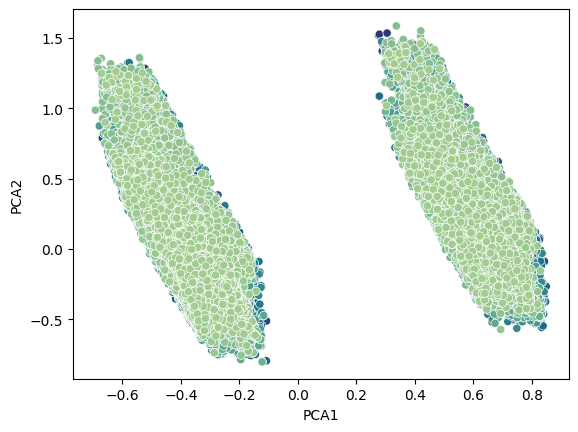

In [ ]:
spotify_K['PCA1'] = X_2D[:, 0]
spotify_K['PCA2'] = X_2D[:, 1]
sns.scatterplot(data=spotify_K, x="PCA1", y="PCA2", hue='track_genre', legend=False, palette="crest_r");

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=8, random_state=833)
kmeans.fit(X_1)
y_kmeans = kmeans.predict(X_1)   

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
spotify_K['cluster'] = y_kmeans
spotify.head()

,track_id,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popular
0,5SuOikwiRyPMVoIQDJUgSV,0.73,0.044043,0.0,0.686294,0.4610,0.090909,0.791392,0.0,0.148187,0.032329,0.000001,0.3580,0.718593,0.361245,0.8,acoustic,1
1,4qPNDBW1i3p13qLCt0Ki3A,0.55,0.028566,0.0,0.426396,0.1660,0.090909,0.597377,1.0,0.079067,0.927711,0.000006,0.1010,0.268342,0.318397,0.8,acoustic,0
2,1iJBSr7s7jYXzM8EGcbK5b,0.57,0.040255,0.0,0.444670,0.3590,0.000000,0.736123,1.0,0.057720,0.210843,0.000000,0.1170,0.120603,0.313643,0.8,acoustic,0
3,6lfxq3CG4xtTiEg7opyCyx,0.71,0.038557,0.0,0.270051,0.0596,0.000000,0.573701,1.0,0.037617,0.908635,0.000071,0.1320,0.143719,0.746758,0.6,acoustic,1
4,5vjLSffimiIP26QG5WcN2K,0.82,0.037969,0.0,0.627411,0.4430,0.181818,0.737103,1.0,0.054508,0.470884,0.000000,0.0829,0.167839,0.492863,0.8,acoustic,1


In [ ]:
spotify_K.cluster.value_counts()

0    25010
2    18089
1    14819
5    14181
7     8312
3     7283
6     5982
4     4304
Name: cluster, dtype: int64

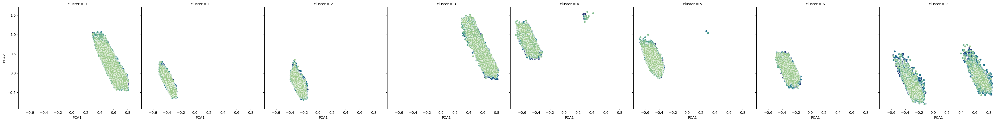

In [ ]:
sns.relplot(data=spotify_K, x="PCA1", y="PCA2", hue='track_genre', col='cluster', legend=False, palette="crest_r");

After creating 8 distinct clusters, we wonder if the original track genres are reflective of the "new" group genres the model has created. This would help us in understanding and naming the clusters according to the types of `track_genre` categorizations that are included within each cluster (e.g. if we find many rock-related songs in one cluster, then we call the cluster "rock")

In [ ]:
# How many of the genres are present in each cluster?
print('Number of genres in cluster #0:', spotify_K[spotify_K.cluster == 0].track_genre.nunique())
print('Number of genres in cluster #1:', spotify_K[spotify_K.cluster == 1].track_genre.nunique())
print('Number of genres in cluster #2:', spotify_K[spotify_K.cluster == 2].track_genre.nunique())
print('Number of genres in cluster #3:', spotify_K[spotify_K.cluster == 3].track_genre.nunique())
print('Number of genres in cluster #4:', spotify_K[spotify_K.cluster == 4].track_genre.nunique())
print('Number of genres in cluster #5:', spotify_K[spotify_K.cluster == 5].track_genre.nunique())
print('Number of genres in cluster #6:', spotify_K[spotify_K.cluster == 6].track_genre.nunique())
print('Number of genres in cluster #7:', spotify_K[spotify_K.cluster == 7].track_genre.nunique())

Number of genres in cluster #0: 114
Number of genres in cluster #1: 114
Number of genres in cluster #2: 114
Number of genres in cluster #3: 103
Number of genres in cluster #4: 71
Number of genres in cluster #5: 107
Number of genres in cluster #6: 101
Number of genres in cluster #7: 105


After listing the number of genres per cluster, we see that the information provided by `track_genre` does not actually symbolize much when clustering the dataset into distinct groups based on their audio features. Most of the 114 genres are represented in each cluster, making it nearly impossible for us to distinguish genre groups from this model.

#### Manually assigning genre groups

Since we were unable to form clusters that differentiated between different genres, we assigned the 114 genres into a total of 10 'super-genres' based on research and our judgement. Our references at the end of the notebook expand on our criteria for this categorization.

In [ ]:
spotify['track_genre'] = spotify.track_genre.replace(['ambient', 'anime', 'children', 'chill', 'comedy', 'disney', 'gospel', 'happy', 'indie', 'industrial', 'kids', 'new-age', 'party', 'pop-film', 'romance', 'sad', 'show-tunes', 'singer-songwriter', 'sleep', 'songwriter', 'study'], 'other')
spotify['track_genre'] = spotify.track_genre.replace(['k-pop', 'synth-pop', 'j-pop', 'cantopop', 'mandopop', 'mpb', 'power-pop', 'indie-pop', 'j-idol'], 'pop')
spotify['track_genre'] = spotify.track_genre.replace(['electro', 'edm', 'house', 'dubstep', 'chicago-house', 'club', 'techno', 'idm', 'detroit-techno', 'garage', 'progressive-house', 'deep-house', 'dance', 'breakbeat', 'drum-and-bass', 'jungle', 'trance', 'minimal-techno', 'progressive-house', 'hardstyle'], 'electronic')
spotify['track_genre'] = spotify.track_genre.replace(['alt-rock', 'alternative', 'grunge', 'punk', 'punk-rock', 'rock-n-roll', 'j-rock', 'emo', 'hard-rock', 'hardcore', 'psych-rock', 'rockabilly'], 'rock')
spotify['track_genre'] = spotify.track_genre.replace(['black-metal', 'death-metal', 'grindcore', 'heavy-metal', 'metalcore', 'goth'], 'metal')
spotify['track_genre'] = spotify.track_genre.replace(['latino', 'latin', 'reggaeton', 'salsa', 'spanish', 'tango', 'brazil', 'samba', 'pagode', 'forro', 'sertanejo'], 'hispanic')
spotify['track_genre'] = spotify.track_genre.replace(['opera', 'piano', 'classical', 'jazz', 'blues', 'disco', 'classic'], 'classic-and-oldschool')
spotify['track_genre'] = spotify.track_genre.replace(['acoustic', 'bluegrass', 'country', 'folk', 'guitar', 'honky-tonk'], 'folk-and-acoustic')
spotify['track_genre'] = spotify.track_genre.replace(['r-n-b', 'hip-hop', 'afrobeat', 'soul', 'funk', 'groove', 'trip-hop', 'reggae', 'ska', 'dancehall', 'dub'], 'hip-hop-and-afrobeat')
spotify['track_genre'] = spotify.track_genre.replace(['j-dance', 'french', 'malay', 'swedish', 'german', 'indian', 'british', 'turkish', 'iranian'], 'world-music')

In [ ]:
spotify.track_genre.nunique()

10

In [ ]:
genre_dummies = pd.get_dummies(spotify['track_genre'], prefix='genre', drop_first=True)   # Dummifying the new track_genre column
spotify = pd.concat([spotify,genre_dummies], axis=1)

In [ ]:
# Remove genre_other column and track_genre column
spotify.drop(['track_genre'],axis=1,inplace=True)

In [ ]:
spotify.head(3).round(2)

,track_id,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,...,popular,genre_electronic,genre_folk-and-acoustic,genre_hip-hop-and-afrobeat,genre_hispanic,genre_metal,genre_other,genre_pop,genre_rock,genre_world-music
0,5SuOikwiRyPMVoIQDJUgSV,0.73,0.04,0.0,0.69,0.46,0.09,0.79,0.0,0.15,...,1,0,1,0,0,0,0,0,0,0
1,4qPNDBW1i3p13qLCt0Ki3A,0.55,0.03,0.0,0.43,0.17,0.09,0.60,1.0,0.08,...,0,0,1,0,0,0,0,0,0,0
2,1iJBSr7s7jYXzM8EGcbK5b,0.57,0.04,0.0,0.44,0.36,0.00,0.74,1.0,0.06,...,0,0,1,0,0,0,0,0,0,0


### 03c. Using various models to predict popularity

In [ ]:
# Reassigning the variables with the new dummified genre variables
X = spotify.drop(['track_id','popularity','popular'], axis=1)
y = spotify['popular']
X.shape, y.shape

((97980, 23), (97980,))

In [ ]:
# Splitting the data points into training and testing sets for the models
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=834)

Since the dataset is so large, we decided to use 25% for the test size. We think it is more worthwhile to provide the model with a large amount of data for training.

In terms of model selection, we decided to explore 4 models to compare and see which ones perform the best. To get a variety of approaches together, we decided to use the Gaussian Naive Bayes (GNB), the Logistic Regression (LR), Decision Tree Classifier (DTC) and the Random Forest Classifier (RTC) models.

The GNB and LR models are fundamental probabilistic models that will set a benchmark or baseline for overall performance of our models and the more sophisticated models. Both GNB and LR models have their drawbacks, which we will explain further along. We chose tree-based models like DTC and RTC because these are able to capture more complex non-linear relationships, which is what we need for the case of the multiple and diverse audio features we are working on. Again, we will discuss the drawbacks of tree-based models later on.

In [ ]:
# Importing and initializing the models
from sklearn.naive_bayes import GaussianNB
GNB_model = GaussianNB()
from sklearn.linear_model import LogisticRegression
LR_model = LogisticRegression(solver='liblinear')
from sklearn.tree import DecisionTreeClassifier
DTC_model = DecisionTreeClassifier(random_state=833)
from sklearn.ensemble import RandomForestClassifier
RFC_model = RandomForestClassifier(n_estimators=100)
from sklearn.metrics import accuracy_score

In [ ]:
LR_model.fit(X_train, y_train)
GNB_model.fit(X_train, y_train)
DTC_model.fit(X_train, y_train)
RFC_model.fit(X_train, y_train)

RandomForestClassifier()

#### Gaussian Naive Bayes Model

In [ ]:
y_GNB_model = GNB_model.predict(X_test)

# Calculating the accuracy score
print("Accuracy score:", accuracy_score(y_test, y_GNB_model).round(2))

# Calculating sensitivity
GNB_P = sum(y_test == 1) # How many songs within test group are popular - Positive
GNB_TP = sum((y_test == 1) & (y_GNB_model == 1)) #Positive in both test and model - True Positive
print("Sensitivity score:", round((GNB_TP/GNB_P), 2))

# Calculating specificity
GNB_N = sum(y_test == 0) # How many songs in test set aren't popular? - Negative
GNB_TN = sum((y_test == 0) & (y_GNB_model == 0)) # How many correct/true negatives did the model generate? - True negative
print("Specificity score:", round((GNB_TN/GNB_N), 2))

Accuracy score: 0.69
Sensitivity score: 0.57
Specificity score: 0.7


In [ ]:
# Checking a portion of the predictions versus the actual values
print(np.round(y_GNB_model[1200:1235]))
print(y_test[1200:1235].to_numpy())

[0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0]
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


Looking at the scores as well as a random sample of the predictions against the actual values, we can see that the model has not been very effective in making its predictions. Right away from the accuracy score, we can see that it was only able to get the prediction right 69% of the time. Looking further at the sensitivity and specificity scores we can see that the model is only predicting non-popular songs correctly 70% of the time. Considering the number of non popular songs in our dataset we would expect this number to be higher. However, more importantly, the model is predicting 'correctly' about 57% of the time. While this is not a low sensitivity, we believe that the model is not the most apt for predictions. This is not surprising since the Gaussian Naive Model is - as its name suggests - very naive, as it assumes that variables are independent to one another, and therefore share no relationship towards the prediction.

#### Logistic Regression Model

In [ ]:
y_LR_model = LR_model.predict(X_test)

# Calculating the accuracy score
print("Accuracy score:", accuracy_score(y_test, y_LR_model).round(2))

# Calculating sensitivity
LR_P = sum(y_test == 1) # How many songs within test group are popular - Positive
LR_TP = sum((y_test == 1) & (y_LR_model == 1)) #Positive in both test and model - True Positive
print("Sensitivity score:", round((LR_TP/LR_P), 2))

# Calculating specificity
LR_N = sum(y_test == 0) # How many songs in test set aren't popular? - Negative
LR_TN = sum((y_test == 0) & (y_LR_model == 0)) # How many correct/true negatives did the model generate? - True negative
print("Specificity score:", round((LR_TN/LR_N), 2))

Accuracy score: 0.89
Sensitivity score: 0.0
Specificity score: 1.0


In [ ]:
# Checking a portion of the predictions versus the real values
print(np.round(y_LR_model[1200:1235]))
print(y_test[1200:1235].to_numpy())

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


The second model we ran was a Logistic Regression. While we were able to increase the accuracy from this model, it is driven by the model predicting almost all 0s. This can be seen from both the comparison between the predictions and the actual values as well as with the sensitivity score. Therefore, this model actually does nothing to answer our core objective. We are not sure why the model is not predicting any true positives, however it probably could improve after tweaking model's hyperparameters. 

LR models are prone to overfitting, especially when given so many variables. Because of the high amounts of unpopular songs in the population, it is not surprising to see that the model is now declaring a True Negative rate of 100%.

#### Decision Tree Model

In [ ]:
y_DTC_model = DTC_model.predict(X_test)

# Calculating the accuracy score
print("Accuracy score:", accuracy_score(y_test, y_DTC_model).round(2))

# Calculating sensitivity
DTC_P = sum(y_test == 1) # How many songs within test group are popular - Positive
DTC_TP = sum((y_test == 1) & (y_DTC_model == 1)) #Positive in both test and model - True Positive
print("Sensitivity score:", round((DTC_TP/DTC_P),2))

# Calculating specificity
DTC_N = sum(y_test == 0) # How many songs in test set aren't popular? - Negative
DTC_TN = sum((y_test == 0) & (y_DTC_model == 0)) # How many correct/true negatives did the model generate? - True negative
print("Specificity score:", round((DTC_TN/DTC_N),2))

Accuracy score: 0.87
Sensitivity score: 0.47
Specificity score: 0.92


In [ ]:
# Checking a portion of the predictions versus the actual values
print(np.round(y_DTC_model[1200:1235]))
print(y_test[1200:1235].to_numpy())

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


The Decision Tree Model gave us far better results than the models thus far. As we can see the accuracy score is 87%. Compared to the Logistic Regression model we can see that its not predicting the true negatives correctly 92% of the time. The most important metric here is the sensitivity. We can see that this model has the highest sensitivity so far, as the portion of compared predictions and actual values do have some overlap in terms of True Positives. However, we had some concerns with the complexity with the model and a risk of overfitting this complex dataset, which led to us making the decision tree process more robust by using a Random Forest model.

#### Random Forest Model

In [ ]:
y_RFC_model = RFC_model.predict(X_test)

# Calculating the accuracy score
print("Accuracy score:", accuracy_score(y_test, y_RFC_model).round(2))

# Calculating sensitivity
RFC_P = sum(y_test == 1) # How many songs within test group are popular - Positive
RFC_TP = sum((y_test == 1) & (y_RFC_model == 1)) #Positive in both test and model - True Positive
print("Sensitivity score:", round((RFC_TP/RFC_P), 2))

# Calculating specificity
RFC_N = sum(y_test == 0) # How many songs in test set aren't popular? - Negative
RFC_TN = sum((y_test == 0) & (y_RFC_model == 0)) # How many correct/true negatives did the model generate? - True negative
print("Specificity score:", round((RFC_TN/RFC_N), 2))

Accuracy score: 0.92
Sensitivity score: 0.33
Specificity score: 0.99


In [ ]:
# Checking a portion of the predictions versus the actual values
print(np.round(y_RFC_model[1200:1235]))
print(y_test[1200:1235].to_numpy())

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


Something to consider about tree-based models is that they are prone to memorizing the noise present in a dataset, therefore, considering the imbalance of the data (more unpopular than popular), the models would probably start overfitting for the unpopular predictions. We hope that a randomization step at the level of each branch formation can provide better results.

Looking at the outcomes from the Random Forest model, we are happy with the accuracy score of 92% because it is the first model that has shown improvement over a model predicting strictly 0s (which would have 90% accuracy, 10% of the data are popular). While only 33% of the predicted positives are true positives, we consider this model a good starting point as we move further into our analysis.

## 04. Understanding how features affect popularity

### 04a. Using a XGBoost Model and SHAP to explain model predictions

Using the SHAP (SHapley Additive exPlanations) library we can explain the output of machine learning models. We used a XGBoost Model (a tree-based machine learning model) to get the SHAP values because the documentation on SHAP used this particular model for tree-based model use cases. Since the documentation only shows the use of this model, we believe this is probably the most suitable model for this case and we do not have the expertise to apply it with our previous tree-based models. 

In [ ]:
# Used reference for this section, please see below
!pip install shap -q

import xgboost
import shap
shap.initjs()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 kB 9.8 MB/s eta 0:00:00


In [ ]:
# Train/test split of the variables (using the original variables instead)
X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.05, random_state=834)

In [ ]:
# Training a XGBoost model
XGB_model = xgboost.XGBClassifier().fit(X_1_train, y_1_train)

# Computing SHAP values
explainer = shap.Explainer(XGB_model, X_1_train)
shap_values = explainer(X_1_train)

100%|===================| 92957/93081 [07:18<00:00]       

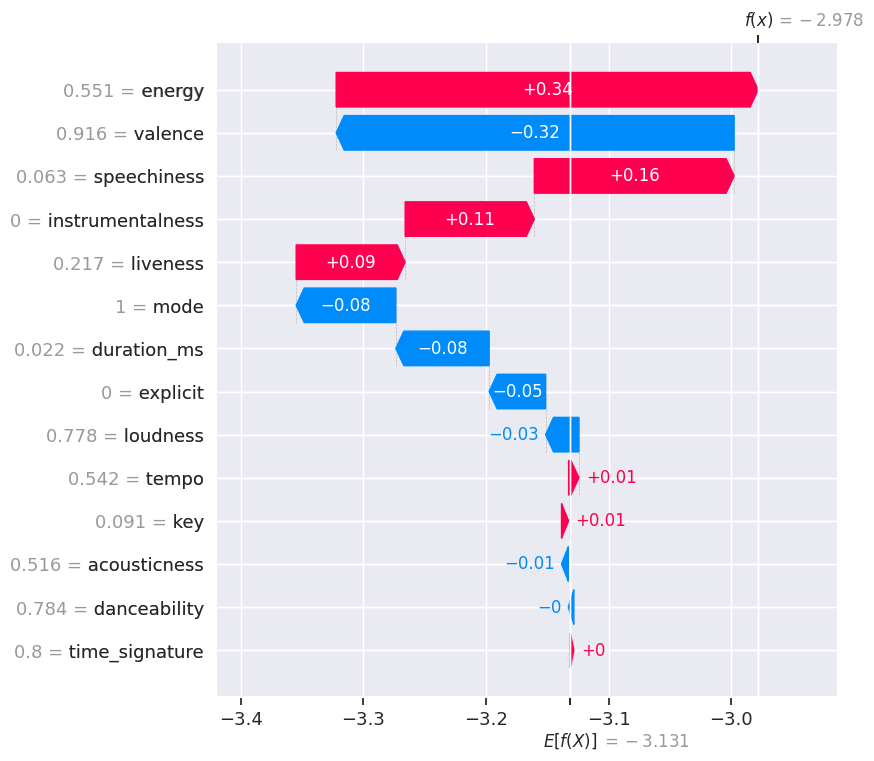

In [ ]:
# Waterfall plot for first observation
shap.plots.waterfall(shap_values[0], max_display=14)

Here we observe how the specific values of the features, and the importance of each feature have impacted the predictions of the model on the first data point in the training sample. For this specific observation, we see that an Energy score of 0.55 and a Valence score of 0.92 influenced the not-popular prediction the most. Energy had a positive effect and Valence had a negative effect on its popularity. 

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


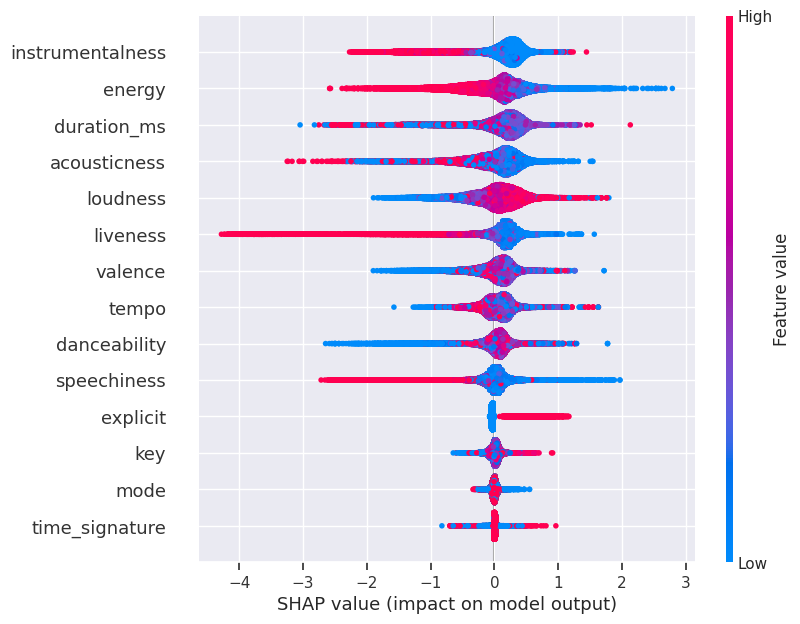

In [ ]:
# Beeswarm plot
shap.plots.beeswarm(shap_values, max_display=14)

The beeswarm plot explains how each feature affected the overall predictions of the training set. We see that instrumentalness is the most important feature in predicting popularity here, and that the higher the instrumentalness value, the lower chance it has of being popular. 

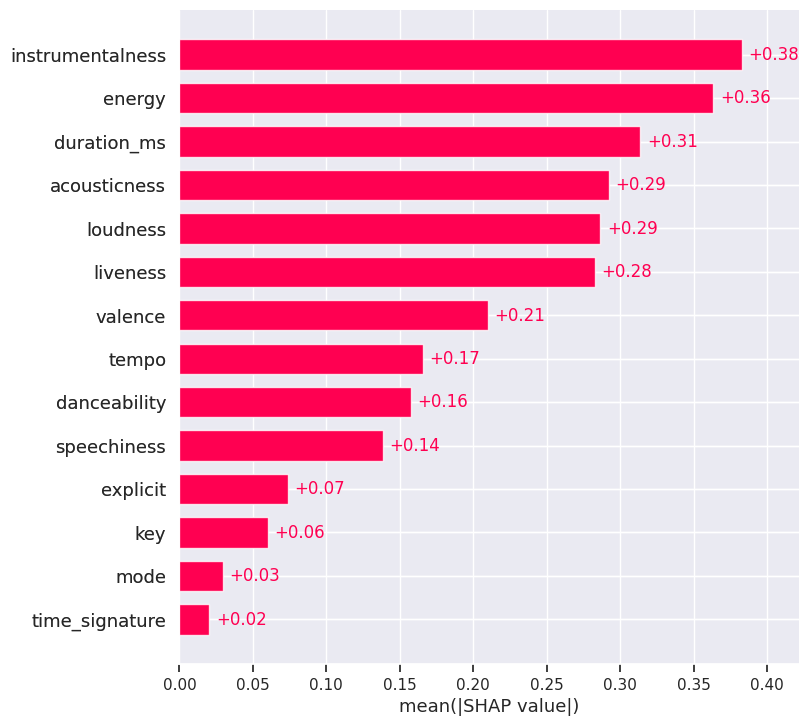

In [ ]:
# Looking at the features importance using SHAP values
shap.plots.bar(shap_values, max_display=14)

Larger contributions have a bigger impact on the model's predictions. We see that the most important features for the model's predictions are Instrumentalness, Energy, Acousticness, Duration, Loudness and Liveness. The less important features are Valence, Tempo, Danceability, and Speechiness. Finally, the least important features seem to be `explicit`, `key`, `mode`, and `time_signature`. 

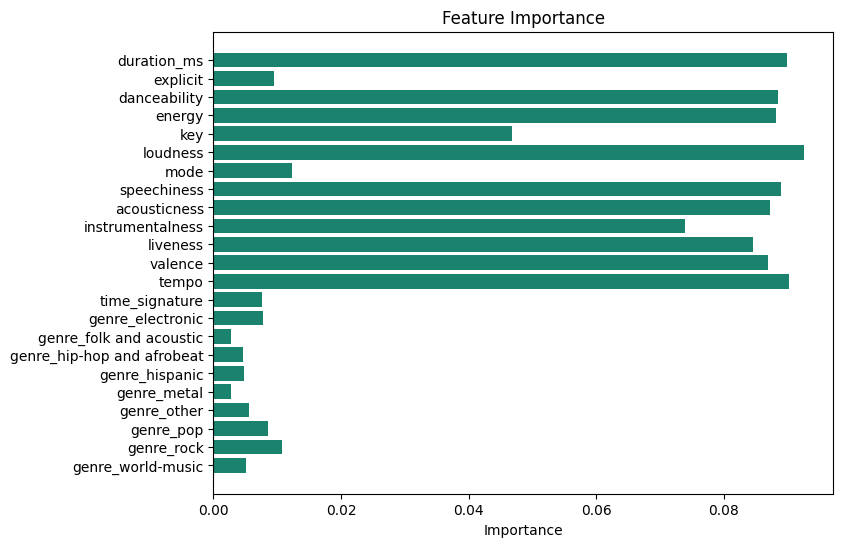

In [ ]:
# Important features based on the Random Forest model compared to important features based on SHAP values
fig, ax = plt.subplots(figsize=(8, 6))
feat_importance = RFC_model.feature_importances_
feat_names = X.columns
y_pos = np.arange(len(feat_names))
ax.barh(y_pos, feat_importance, align='center', color="#1B826D")
ax.set_yticks(y_pos)
ax.set_yticklabels(feat_names)
ax.invert_yaxis()  # Labels read top-to-bottom
ax.set_xlabel('Importance')
ax.set_title('Feature Importance')
plt.show()

Here we see the most important features for the popularity predictions being Loudness, Tempo, Energy, Danceability, Duration and Speechiness. We see that the dummified genre variables were not very useful to the model, being most of the low-ranked features. We do see however, that the genre variables that are higher in importance have also been in our "popular genres" list previously (Rock, Pop, Electronic), which supports our findings and expectations. We also see that `mode`, `explicit` and `time_signature` are audio features that are not very important. These findings are similar to the findings we got with the SHAP values. 

### 04b. Using Parallel Coordinates Plot (PCP) to identify trends

In [ ]:
# Used ChatGPT for this section, please see below
import plotly.express as px

spotify_PCP_hi = spotify[["popularity", "instrumentalness", "energy", "acousticness", "duration_ms", "loudness"]]
fig = px.parallel_coordinates(spotify_PCP_hi, color="popularity", labels={
    "popularity": "Popularity",
    "instrumentalness": "Instrumentalness",
    "energy": "Energy",
    "acousticness": "Acousticness",
    "duration_ms": "Duration",
    "loudness": "Loudness"
})
fig.show()

After we extracted the top 5 most important variables in the SHAP features importance chart above, we created a PCP chart that could show us the patterns that cause high popularity among songs. As we can see from the chart, there are feature values that are far more useful to predicting the popularity of a song. We see this by looking at the yellow lines of the population. These yellow lines represent high popularity, and by looking at the concentration of yellow lines at a particular value per feature, we can see trends that might be linked to popular songs. Some of the variables that are a significant factor are low instrumentalness, high energy, low acousticness, low duration, and high loudness.

In [ ]:
spotify_PCP_lo = spotify[["popularity", "liveness", "valence", "tempo", "danceability", "speechiness"]]
fig = px.parallel_coordinates(spotify_PCP_lo, color="popularity", labels={
    "popularity": "Popularity",
    "liveness": "Liveness",
    "valence": "Valence",
    "tempo": "Tempo",
    "danceability": "Danceability",
    "speechiness": "Speechiness"
})
fig.show()

Here we visualized the lower-importance features against popularity on a PCP chart. We see that in comparison to the previous chart, the trend lines are less obvious. Some features have yellow lined dispersed throughout the range of values, which means that the variable does not explain popularity well (e.g. most tempo values can create a popular song, and any valence value can create a popular song as well). 

##05. Model Improvements

After breaking down the feature variables and how they affected the popularity of the song, we wanted to go back to the model and see if there were ways to improve it. We decided to drop the feature variables that were not very effective in predicting the likely popularity of a song (mode, time_signature, and all genre variables). 

In [ ]:
# Copied df for use on model improvements
spotify_adjusted = spotify.copy()

In [ ]:
# Drop mode, time signature, genre variables based on feature importance chart
X = spotify_adjusted.drop(['track_id','popularity','popular','mode','time_signature','genre_other','genre_electronic','genre_folk and acoustic','genre_hip-hop and afrobeat','genre_hispanic','genre_metal','genre_pop','genre_rock','genre_world-music'], axis=1)
y = spotify_adjusted['popular']
X.shape, y.shape

((97980, 12), (97980,))

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=834)

In [ ]:
RFC_model.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_RFC_model = RFC_model.predict(X_test)

In [ ]:
# Calculating the accuracy score
print("Accuracy score:", accuracy_score(y_test, y_RFC_model).round(2))

# Calculating sensitivity
RFC_P = sum(y_test == 1) # How many songs within test group are popular - Positive
RFC_TP = sum((y_test == 1) & (y_RFC_model == 1)) #Positive in both test and model - True Positive
print("Sensitivity score:", round((RFC_TP/RFC_P), 2))

# Calculating specificity
RFC_N = sum(y_test == 0) # How many songs in test set aren't popular? - Negative
RFC_TN = sum((y_test == 0) & (y_RFC_model == 0)) # How many correct/true negatives did the model generate? - True negative
print("Specificity score:", round((RFC_TN/RFC_N), 2))

Accuracy score: 0.95
Sensitivity score: 0.54
Specificity score: 1.0


Comparing this model to the previous Random Forest Classifier model we can see that this model is far better at predicting both true positives and true negatives. Overall the accuracy for this model is 95% and it has over 50% true positives. While it is still not a strong model, it is able to predict a popular song over 50% of the time which we believe is satisfactory considering some of the limitations of the dataset. Overall, we see an improvement by dropping the non-important or low importance features on the same model.

## 06. Findings, Limitations and Conclusions

From this exercise, we can conclude that predicting song popularity is extraordinarily complex. 

### 06a. The Problem with Music Genre

While a large part of our data processsing invloved looking at the Genre fields and how to include them in our models, we can see that in reality the genre is not a great predictor in the success of a song. This could be because, as seen in the K-Means Clustering, `track_genre` categorization really does not depend on audio features. The fact that one single track can be classified into 9 different genres makes genre classification seem arbitrary. Such subjectivity in genre classification might render music genre a useless variable for our model.

### 06b. External Limitations

We obviously did not expect to develop a perfect model from the data, as song quality cannot be accurately represented in a quantitative format. Many other factors are at play, including marketing and artist popularity. Despite these external limitations, we attempted to develop predictions based on the data at hand.

### 06c. Data Limitations and Conclusions

The question that became critical to our analysis was, 'how do we define popularity?' Using the data at hand, is a song popular if it is in the top 10% in popularity score? 20%? 50%? While our model certainly would have had higher predictive quality if we set popularity at 40 out of 100 (around the mean of the dataset), we felt that a song that simply is in the top 50% is not a hit song. For that reason, we increased the threshold for a hit song to the top 10% of the data, even though it resulted in imbalanced data and lower model quality as a whole. Since 90% of songs were not popular, the model could not train well enough on what a 'popular' song was. We accepted this limitation by the end of our analysis and simply worked to developed the model as best we could despite this imbalance.

The random forest model worked best for our complex dataset as it is a robust decision tree model that has the ability to take into account more complicated and often random values of the different features. We did want to risk overfitting the data with one decision tree, and all other classification models we had access to did not accurately model 114 different genres. If we had more time, it would have also been interesting to examine specific genres in more depth to find out what values of variables could have created a popular song in a specific genre. Nonetheless, we feel that a 54% true positive rate would be a very acceptable outcome to up and coming artists if they could align their songs to the feature values in our model.

### 06d. Possible Solutions

In order to combat the issue with the imbalanced data, we researched possible solutions if more time was given for this project. According to [this source](https://rihab-feki.medium.com/imbalanced-data-best-practices-f3b6d0999f38), the best models for imbalanced data are tree-based algorithms (e.g. DTC, RTC) and boosting algorithms (e.g. XGBoost). We used both types during our modelling phase, however, we could have also elaborated more on the results of the XGBoost model instead of just using it to find the SHAP values of each feature. The article also suggests to use stratified train-test split, which is a solution that we did try to add, but only managed to unexplainably reduce accuracy and overall performance of our models. Finally, we could try using data resampling methods. The first way would be to oversample by creating a number of "artificial" copies of the current minority class in the population (popular songs). We could also undersample by removing a portion of the majority class to even out the representation among the two classes. 

In [ ]:
# Exporting the spotify dataframe as a CSV file to use in the dashboard
spotify.to_csv('/content/drive/Shareddrives/Team 6 IS833/spotify.csv')

# References

* [Seaborn Documentation:](https://seaborn.pydata.org/) palettes, creating axes, parameters for each plot type.

Section 02a.
* [Contour Plot with Seaborn](https://www.python-graph-gallery.com/80-contour-plot-with-seaborn)

Section 03b.
* **K-Means Clustering:** we use the "01-Intro-to-Unsupervised.ipynb" notebook in Chapter 13 of the course repository
* To manually group sub-genres into bigger groups of genres, we searched on Google to see what are the parent genres of the sub-genres. Since there are many genres, and not all fell into a bigger group, we grouped the stray genres into one group called "Other"

Section 03c. 
* [Machine Learning with tree-based models](https://app.datacamp.com/learn/courses/machine-learning-with-tree-based-models-in-python)

Section 04a.
* [Using SHAP with Python](https://towardsdatascience.com/introduction-to-shap-with-python-d27edc23c454)
* [Waterfall plot with SHAP](https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/waterfall.html)
* [Beeswarm plot with SHAP](https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/beeswarm.html)
* [Feature importances with a forest of trees](https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html)

Section 04b. 
* Asked ChatGPT what types of graphs can visualize patterns and trends on multi-variable data. Later asked for more "interactive" types of graphs and got the code for a parallel coordinates plot. 
* [Visualize data using Parallel Coordinates Plot](https://www.analyticsvidhya.com/blog/2021/11/visualize-data-using-parallel-coordinates-plot/) 

Section 06d.
* [Imbalanced data best practices](https://rihab-feki.medium.com/imbalanced-data-best-practices-f3b6d0999f38)